# Enernoc 100 Building

In [1]:
#Importing required libraries

import pandas as pd
from pandas import Series,DataFrame
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
%matplotlib inline

import pandas as pd

import json

import os

from matplotlib.pyplot import *

import ipyleaflet as ipyl
import ipywidgets as ipyw
import json

from ipyleaflet import (
    Map,
    Marker,
    TileLayer, ImageOverlay,
    Polyline, Polygon, Rectangle, Circle, CircleMarker,
    GeoJSON,
    DrawControl
)


### Importing Meta data file, which contains: INDUSTRY, SUB INDUSTRY, SQ FOOT etc. 

In [2]:

meta_df =  pd.read_csv("C:/Users/arjun/Documents/Enernoc_Project_Aj/meta/all_sites.csv")



### Importing Sampple data file from csv 10, which contains: VALUE, date and time, estimated etc.

In [3]:
sample_df = pd.read_csv("C:/Users/arjun/Documents/Enernoc_Project_Aj/Data_csv/csv/10.csv")

In [4]:
sample_df.head()

,timestamp,dttm_utc,value,estimated,anomaly
0,1325376600,2012-01-01 00:10:00,105.7895,0,NaN
1,1325376900,2012-01-01 00:15:00,104.7318,0,NaN
2,1325377200,2012-01-01 00:20:00,102.2920,0,NaN
3,1325377500,2012-01-01 00:25:00,102.7851,0,NaN
4,1325377800,2012-01-01 00:30:00,101.6106,0,NaN


In [5]:
meta_df.head()

,SITE_ID,INDUSTRY,SUB_INDUSTRY,SQ_FT,LAT,LNG,TIME_ZONE,TZ_OFFSET
0,6,Commercial Property,Shopping Center/Shopping Mall,161532,34.783001,-106.895250,America/Denver,-06:00
1,8,Commercial Property,Shopping Center/Shopping Mall,823966,40.320247,-76.404942,America/New_York,-04:00
2,9,Commercial Property,Corporate Office,169420,40.946751,-74.742087,America/New_York,-04:00
3,10,Commercial Property,Shopping Center/Shopping Mall,1029798,39.732504,-75.006861,America/New_York,-04:00
4,12,Commercial Property,Business Services,179665,39.694541,-74.899166,America/New_York,-04:00


In [14]:
meta_df.describe()

,SITE_ID,SQ_FT,LAT,LNG
count,100.000000,1.000000e+02,100.000000,100.000000
mean,338.880000,2.252528e+05,38.345746,-90.367199
std,276.371119,3.448437e+05,3.535717,18.734536
min,6.000000,1.821000e+03,27.848625,-122.701918
25%,85.500000,4.266150e+04,35.348406,-113.043608
50%,278.000000,9.210550e+04,38.729362,-80.486509
75%,546.000000,2.022598e+05,40.758628,-75.206820
max,887.000000,1.807149e+06,47.820017,-71.060518


In [6]:
meta_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 8 columns):
SITE_ID         100 non-null int64
INDUSTRY        100 non-null object
SUB_INDUSTRY    100 non-null object
SQ_FT           100 non-null int64
LAT             100 non-null float64
LNG             100 non-null float64
TIME_ZONE       100 non-null object
TZ_OFFSET       100 non-null object
dtypes: float64(2), int64(2), object(4)
memory usage: 6.3+ KB


In [16]:
from IPython.display import HTML
HTML('<iframe src=http://enernoc-open.cartodb.com/tables/all_sites/embed_map?title=true&description=true&search=false&shareable=false&cartodb_logo=true&scrollwheel=true&sql=&sw_lat=25&sw_lon=-130&ne_lat=50&ne_lon=-60 width=800 height=700></iframe>')


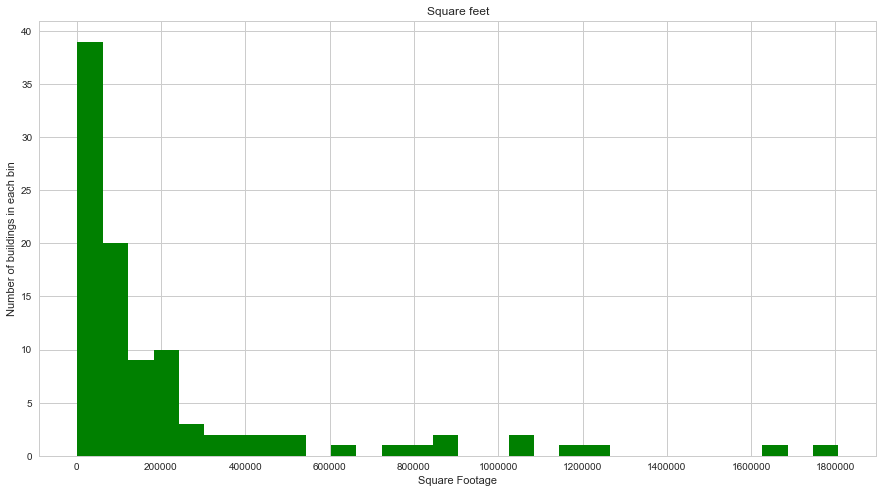

In [17]:


meta_df.hist(column='SQ_FT', figsize=(15,8), bins = 30, color='g')

plt.title('Square feet')
plt.xlabel("Square Footage")
plt.ylabel("Number of buildings in each bin")
plt.locator_params(nbins=15)

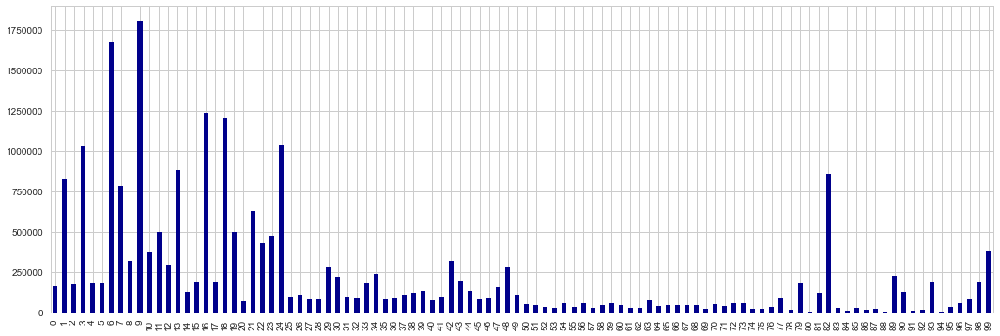

In [18]:
meta_df.SQ_FT.plot(kind='bar',figsize=(18, 6),color='darkblue')

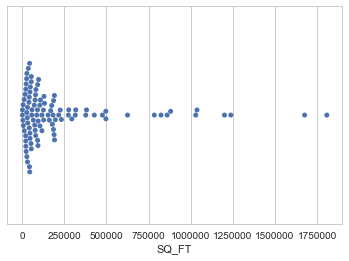

In [201]:
ax = sns.swarmplot(x=meta_df["SQ_FT"])

 #### we have a majority of buildings under 200,000 sqft

In [9]:
meta_pivoted_1 = meta_df.pivot(index='SITE_ID', columns='TIME_ZONE', values='SQ_FT')

meta_pivoted_1.head(10)

TIME_ZONE,America/Chicago,America/Denver,America/Los_Angeles,America/New_York,America/Phoenix
SITE_ID,,,,,
6,NaN,161532.0,NaN,NaN,NaN
8,NaN,NaN,NaN,823966.0,NaN
9,NaN,NaN,NaN,169420.0,NaN
10,NaN,NaN,NaN,1029798.0,NaN
12,NaN,NaN,NaN,179665.0,NaN
13,NaN,NaN,NaN,185847.0,NaN
14,NaN,NaN,1675720.0,NaN,NaN
21,NaN,NaN,NaN,783982.0,NaN
22,NaN,NaN,318130.0,NaN,NaN


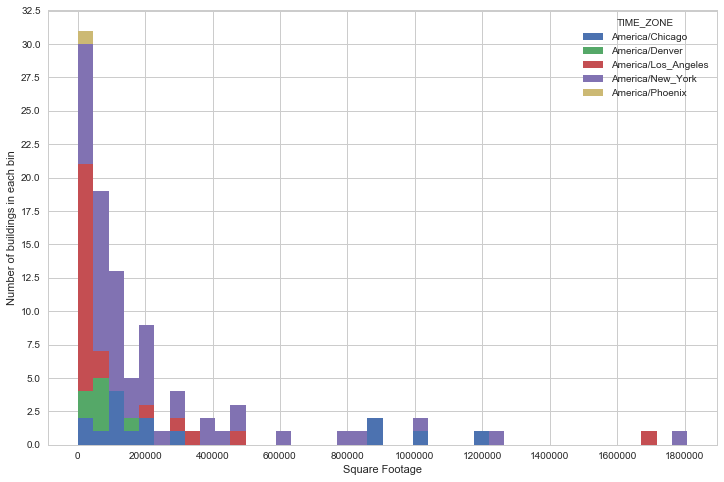

In [20]:
meta_pivoted_1.plot(kind='hist', figsize=(12,8),bins=40, stacked=True)
plt.xlabel("Square Footage")
plt.ylabel("Number of buildings in each bin")
plt.locator_params(nbins=15)

### Finding the count based on SUB INDUSTRY and plotting it 

In [10]:
meta_df['SUB_INDUSTRY'].value_counts()

Primary/Secondary School         25
Grocer/Market                    25
Food Processing                  19
Shopping Center/Shopping Mall    14
Manufacturing                     5
Commercial Real Estate            4
Business Services                 3
Bank/Financial Services           2
Corporate Office                  2
Other Light Industrial            1
Name: SUB_INDUSTRY, dtype: int64

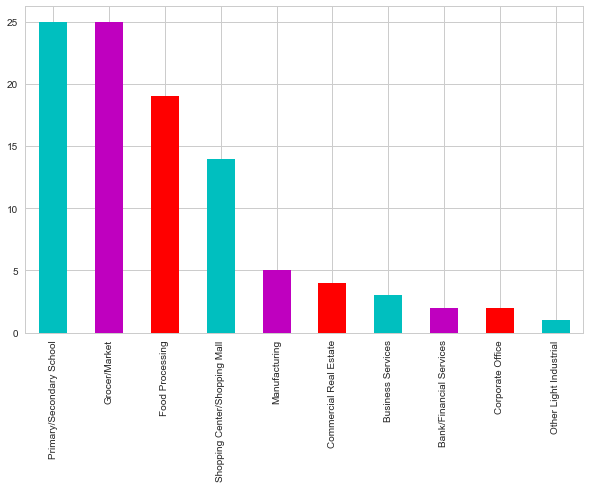

In [22]:
meta_df['SUB_INDUSTRY'].value_counts().plot(
     kind='bar', color= 'cmr', figsize=(10,6) )

In [23]:
meta_df.isnull().sum()

SITE_ID         0
INDUSTRY        0
SUB_INDUSTRY    0
SQ_FT           0
LAT             0
LNG             0
TIME_ZONE       0
TZ_OFFSET       0
dtype: int64

#### There are no NAN values in meta dataset. 

### Grouping by Industry, Sub industry with count and plotting it !

In [24]:
meta_df.groupby(['INDUSTRY', 'SUB_INDUSTRY']).size().sort_values(ascending=False)

INDUSTRY              SUB_INDUSTRY                 
Food Sales & Storage  Grocer/Market                    25
Education             Primary/Secondary School         25
Light Industrial      Food Processing                  19
Commercial Property   Shopping Center/Shopping Mall    14
Light Industrial      Manufacturing                     5
Commercial Property   Commercial Real Estate            4
                      Business Services                 3
                      Corporate Office                  2
                      Bank/Financial Services           2
Light Industrial      Other Light Industrial            1
dtype: int64

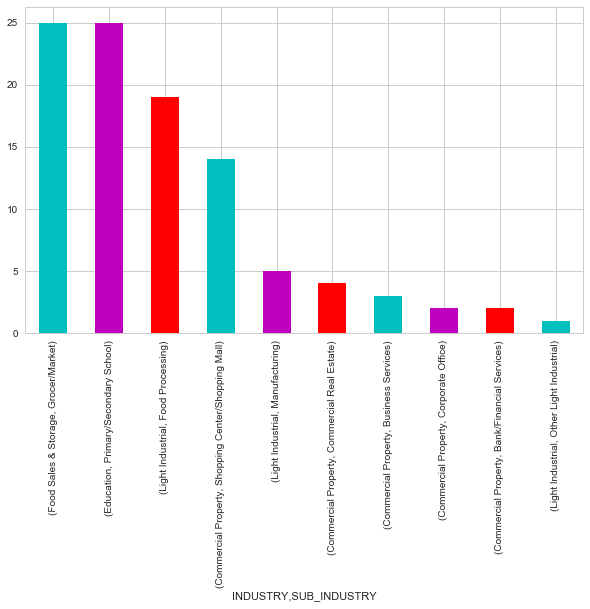

In [25]:
meta_df.groupby(['INDUSTRY', 'SUB_INDUSTRY']).size().sort_values(ascending=False).plot(
     kind='bar', color= 'cmr', figsize=(10,6) )

### Plotting scatter plot for Square footage based on Industry and Sub industry

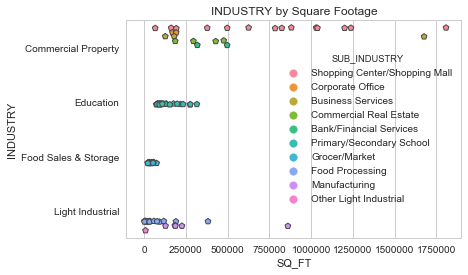

In [26]:
ax = sns.stripplot(x="SQ_FT", y="INDUSTRY",hue = "SUB_INDUSTRY",
                   data=meta_df, jitter=True ,size= 6, marker= "p" ,linewidth=1,split=True)
sns.plt.title("INDUSTRY by Square Footage",fontsize=12)

In [27]:
# meta_df.groupby(['INDUSTRY', 'SUB_INDUSTRY']).size().sort_values(ascending=False).plot(
#      kind='bar', color= 'cmr' )

In [28]:
# meta_df.groupby(['TIME_ZONE','INDUSTRY', 'SUB_INDUSTRY']).size().sort_values(ascending=False).plot(
#      kind='bar', color= 'cmr', figsize=(10,6) )

In [29]:
meta_df.groupby(['TIME_ZONE','INDUSTRY', 'SUB_INDUSTRY']).size().sort_values(ascending=False)

TIME_ZONE            INDUSTRY              SUB_INDUSTRY                 
America/Los_Angeles  Food Sales & Storage  Grocer/Market                    17
America/New_York     Education             Primary/Secondary School         15
                     Light Industrial      Food Processing                  11
                     Commercial Property   Shopping Center/Shopping Mall     9
                     Food Sales & Storage  Grocer/Market                     8
America/Chicago      Education             Primary/Secondary School          7
America/Los_Angeles  Light Industrial      Food Processing                   3
America/Chicago      Light Industrial      Manufacturing                     3
America/Denver       Education             Primary/Secondary School          3
America/Chicago      Commercial Property   Shopping Center/Shopping Mall     3
America/New_York     Commercial Property   Commercial Real Estate            3
                                           Business Servic

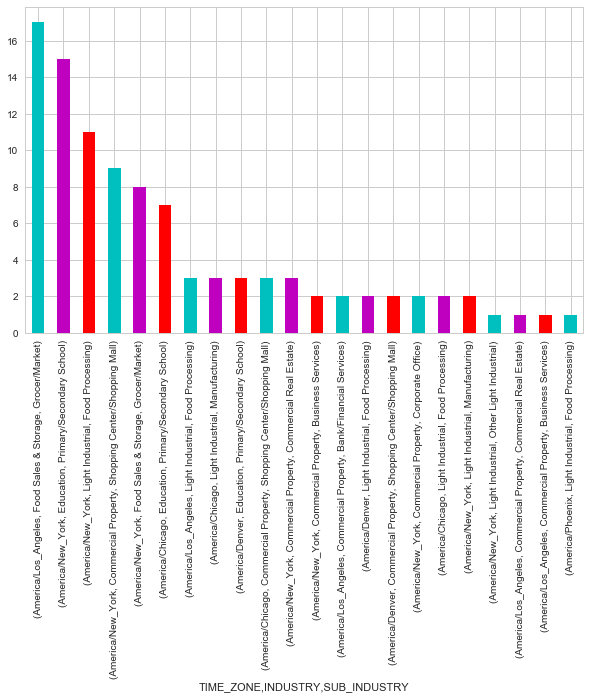

In [30]:
meta_df.groupby(['TIME_ZONE','INDUSTRY', 'SUB_INDUSTRY']).size().sort_values(ascending=False).plot(
     kind='bar', color= 'cmr', figsize=(10,6) )

### Dropping colunms: LAT','LNG','TZ_OFFSET from data set and naming the data set as meta_hdf

In [31]:
meta_hdf = meta_df.drop(['LAT','LNG','TZ_OFFSET', 'SITE_ID'], axis=1)

In [32]:

meta_hdf.sort_values(by= 'SQ_FT', ascending = False)[:10]



,INDUSTRY,SUB_INDUSTRY,SQ_FT,TIME_ZONE
9,Commercial Property,Shopping Center/Shopping Mall,1807149,America/New_York
6,Commercial Property,Business Services,1675720,America/Los_Angeles
16,Commercial Property,Shopping Center/Shopping Mall,1237908,America/New_York
18,Commercial Property,Shopping Center/Shopping Mall,1200131,America/Chicago
24,Commercial Property,Shopping Center/Shopping Mall,1037364,America/Chicago
3,Commercial Property,Shopping Center/Shopping Mall,1029798,America/New_York
13,Commercial Property,Shopping Center/Shopping Mall,880941,America/Chicago
82,Light Industrial,Manufacturing,860258,America/Chicago
1,Commercial Property,Shopping Center/Shopping Mall,823966,America/New_York
7,Commercial Property,Shopping Center/Shopping Mall,783982,America/New_York


In [33]:
# meta_pivoted_2 = meta_df.pivot( columns='SUB_INDUSTRY', values='SQ_FT')

In [34]:
# meta_pivoted_2.plot(kind='bar', figsize=(12,8))
# plt.xlabel("Square Footage")
# plt.ylabel("Number of buildings in each bin")
# plt.locator_params(nbins=15)

### Grouping by Time zone, Industry and Sub industry with MAXIMUM values of Square footage. 

In [35]:
meta_hdf.groupby(['TIME_ZONE','INDUSTRY', 'SUB_INDUSTRY']).max()

SQ_FT
TIME_ZONE           INDUSTRY             SUB_INDUSTRY                          
America/Chicago     Commercial Property  Shopping Center/Shopping Mall  1200131
                    Education            Primary/Secondary School        274418
                    Light Industrial     Food Processing                  33596
                                         Manufacturing                   860258
America/Denver      Commercial Property  Shopping Center/Shopping Mall   161532
                    Education            Primary/Secondary School         92032
                    Light Industrial     Food Processing                  31727
America/Los_Angeles Commercial Property  Bank/Financial Services         496517
                                         Business Services              1675720
                                         Commercial Real Estate          294651
                    Food Sales & Storage Grocer/Market                    52890
                    Light Industrial     Food Processing                 189836
America/New_York    Commercial Property  Business Services               179665
                                         Commercial Real Estate          476246
                                         Corporate Office                191554
                                         Shopping Center/Shopping Mall  1807149
                    Education            Primary/Secondary School        315404
                    Food Sales & Storage Grocer/Market                    74493
                    Light Industrial     Food Processing                 381939
                                         Manufacturing                   225974
                                         Other Light Industrial            7394
America/Phoenix     Light Industrial     Food Processing                   1821

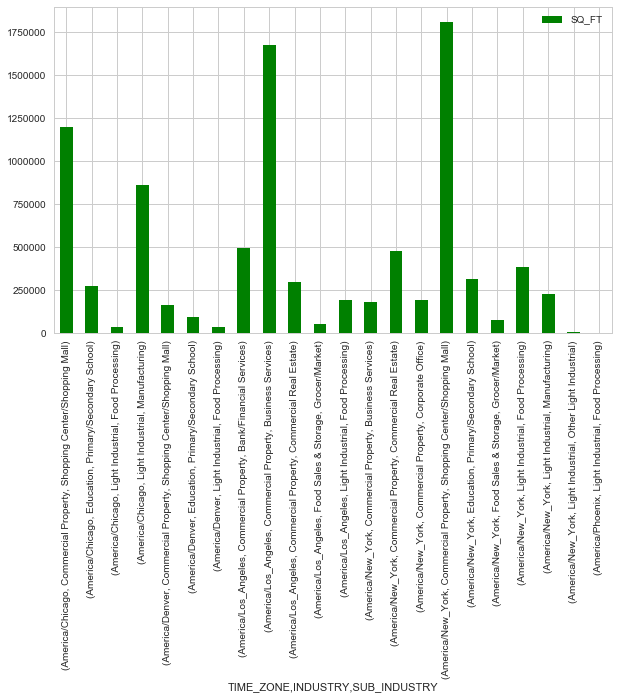

In [36]:
meta_hdf.groupby(['TIME_ZONE','INDUSTRY', 'SUB_INDUSTRY']).max().plot(
     kind='bar', color= 'g', figsize=(10,6) )

In [37]:
# meta_hdf.groupby([ 'SQ_FT']).max('TIME_ZONE')

### Merging data sets in csv.

In [11]:
all_dict = {}

In [39]:
rawfilepath1 = "C:/Users/arjun/Documents/Enernoc_Project_Aj/Data_csv/csv/7.csv"

In [12]:
for filename in filelist:
#     print "Loading "+filename
    
    try:
        df = pd.read_csv(os.path.join(rawfilepath,filename), index_col="dttm_utc", parse_dates=True)
        df = df.drop(["timestamp"], axis=1).tz_localize('UTC')   
            
        #Get the SITE_ID from the filename
        SITE_ID = filename[:-4]
        all_dict[SITE_ID] = df
    except:
        
        print ("Error loading "+filename)
    
all_raw_df = pd.concat(all_dict, axis=1)

Error loading ._.DS_Store
Error loading index.html


In [41]:
# for filename in filelist:
# #     print "Loading "+filename
    
#     try:
#         df = pd.read_csv(os.path.join(rawfilepath,filename))
#         df = df.drop(["timestamp"], axis=1).tz_localize('UTC')   
            
#         #Get the SITE_ID from the filename
#         SITE_ID = filename[:-4]
#         all_dict[SITE_ID] = df
#     except:
        
#         print ("Error loading "+filename)
    
# all_raw_df = pd.concat(all_dict, axis=1)

In [ ]:
dflist = []
for f in allfiles:
   file_name = f[:-4]
   df = pd.read_csv(f)
#    df.insert(1, 'id', file_name)
   dflist.append(df)
frame1 = pd.concat(dflist)

In [15]:
import glob

In [35]:
def slash_rep(path):
    #it replaces \ with /
    return path.replace("\r","/r")

In [37]:
slash_rep(r"C:\Users\arjun\Documents\Enernoc_Project_Aj\Test")

'C:\\Users\\arjun\\Documents\\Enernoc_Project_Aj\\Test'

In [55]:
path =r"C:\\Users\\arjun\\Documents\\Enernoc_Project_Aj\\Test" # use your path

allFiles = glob.glob(path + "/*.csv")
# frame = pd.DataFrame()
dflist = []
for f in allFiles:
   file_name = f[54:-4]
   df = pd.read_csv(f)
   df.insert(1, 'site_id', file_name)
   dflist.append(df)
    
frame = pd.concat(dflist)
# frame = pd.concat(list_)

In [ ]:
# "C:/Users/arjun/Documents/Enernoc_Project_Aj/Data_csv/csv/"

path =r"C:/Users/arjun/Documents/Enernoc_Project_Aj/Data_csv/csv/" # use your path

allFiles = glob.glob(path + "/*.csv")
# frame = pd.DataFrame()
dflist = []
for f in allFiles:
   file_name = f[54:-4]
   df = pd.read_csv(f)
   df.insert(1, 'site_id', file_name)
   dflist.append(df)
    
frame = pd.concat(dflist)

In [58]:
frame['site_id'].unique()

array(['6', '8', '9'], dtype=object)

In [57]:
frame.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 316200 entries, 0 to 105407
Data columns (total 6 columns):
timestamp    316200 non-null int64
site_id      316200 non-null object
dttm_utc     316200 non-null object
value        316200 non-null float64
estimated    316200 non-null int64
anomaly      0 non-null float64
dtypes: float64(2), int64(2), object(2)
memory usage: 16.9+ MB


In [59]:
frame.head()

,timestamp,site_id,dttm_utc,value,estimated,anomaly
0,1325376600,6,2012-01-01 00:10:00,52.1147,0,NaN
1,1325376900,6,2012-01-01 00:15:00,50.9517,0,NaN
2,1325377200,6,2012-01-01 00:20:00,49.8164,0,NaN
3,1325377500,6,2012-01-01 00:25:00,49.1795,0,NaN
4,1325377800,6,2012-01-01 00:30:00,47.6288,0,NaN


In [54]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105408 entries, 0 to 105407
Data columns (total 6 columns):
timestamp    105408 non-null int64
site_id      105408 non-null object
dttm_utc     105408 non-null object
value        105408 non-null float64
estimated    105408 non-null int64
anomaly      0 non-null float64
dtypes: float64(2), int64(2), object(2)
memory usage: 4.8+ MB


In [53]:
df(10)

,timestamp,site_id,dttm_utc,value,estimated,anomaly
0,1325376300,9,2012-01-01 00:05:00,17.9272,0,NaN
1,1325376600,9,2012-01-01 00:10:00,19.4861,0,NaN
2,1325376900,9,2012-01-01 00:15:00,17.9272,0,NaN
3,1325377200,9,2012-01-01 00:20:00,18.7066,0,NaN
4,1325377500,9,2012-01-01 00:25:00,18.7066,0,NaN
5,1325377800,9,2012-01-01 00:30:00,18.7066,0,NaN
6,1325378100,9,2012-01-01 00:35:00,18.7066,0,NaN
7,1325378400,9,2012-01-01 00:40:00,18.7066,0,NaN
8,1325378700,9,2012-01-01 00:45:00,19.4861,0,NaN
9,1325379000,9,2012-01-01 00:50:00,18.7066,0,NaN


In [48]:
allFiles[0]

'C:\\\\Users\\\\arjun\\\\Documents\\\\Enernoc_Project_Aj\\\\Test\\6.csv'

In [49]:
print(file_name)

9


In [43]:
len(file_name)

55

In [19]:
sample_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105407 entries, 0 to 105406
Data columns (total 5 columns):
timestamp    105407 non-null int64
dttm_utc     105407 non-null object
value        105407 non-null float64
estimated    105407 non-null int64
anomaly      0 non-null float64
dtypes: float64(2), int64(2), object(1)
memory usage: 4.0+ MB


In [31]:
frame.head()

,timestamp,dttm_utc,value,estimated,anomaly
0,1325376600,2012-01-01 00:10:00,105.7895,0,NaN
1,1325376900,2012-01-01 00:15:00,104.7318,0,NaN
2,1325377200,2012-01-01 00:20:00,102.2920,0,NaN
3,1325377500,2012-01-01 00:25:00,102.7851,0,NaN
4,1325377800,2012-01-01 00:30:00,101.6106,0,NaN


In [32]:
frame.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10531288 entries, 0 to 105407
Data columns (total 5 columns):
timestamp    int64
dttm_utc     object
value        float64
estimated    int64
anomaly      float64
dtypes: float64(2), int64(2), object(1)
memory usage: 482.1+ MB


In [42]:
all_raw_df_valuesonly = all_raw_df.xs('value', level=1, axis=1)

In [13]:
all_raw_df.sample()

10                        100            \
                             value estimated anomaly    value estimated   
dttm_utc                                                                  
2012-05-01 17:55:00+00:00  393.257       0.0     NaN  13.1309         0   

                                       101                        103   ...    \
                          anomaly    value estimated anomaly    value   ...     
dttm_utc                                                                ...     
2012-05-01 17:55:00+00:00     NaN  69.0359         0     NaN  37.3787   ...     

                              887       9                        92            \
                          anomaly   value estimated anomaly   value estimated   
dttm_utc                                                                        
2012-05-01 17:55:00+00:00     NaN  44.818         0     NaN  3.6936         0   

                                        99                    
                          anomaly    value estimated anomaly  
dttm_utc                                                      
2012-05-01 17:55:00+00:00     NaN  15.5311         0     NaN  

[1 rows x 300 columns]

In [44]:
all_raw_df_valuesonly

,10,100,101,103,109,111,116,12,13,136,...,786,8,805,808,832,88,887,9,92,99
dttm_utc,,,,,,,,,,,,,,,,,,,,,
2012-01-01 00:05:00+00:00,NaN,4.7271,25.4666,11.8662,5.9179,NaN,10.4499,27.0053,NaN,NaN,...,253.3193,NaN,3.2456,NaN,18.1388,8.4734,NaN,17.9272,2.1106,3.4221
2012-01-01 00:10:00+00:00,105.7895,5.2524,25.7734,11.8662,6.1809,7.3743,12.7721,25.0049,25.3312,1.8856,...,253.3193,20.9518,2.9860,5.4940,18.1388,7.5319,59.5825,19.4861,1.5830,2.6324
2012-01-01 00:15:00+00:00,104.7318,5.5150,25.1598,12.4596,5.6549,8.2960,11.6110,26.0051,26.3444,1.9045,...,245.6430,20.9518,2.9860,5.7687,18.1388,8.4734,59.0096,17.9272,2.1106,2.6324
2012-01-01 00:20:00+00:00,102.2920,5.2524,25.1598,12.4596,5.9179,8.2960,10.4499,25.0049,25.3312,1.9045,...,253.3193,27.9357,3.3754,5.4940,24.1851,8.4734,56.7180,18.7066,1.5830,3.1589
2012-01-01 00:25:00+00:00,102.7851,5.2524,25.7734,11.8662,6.0494,8.2960,12.7721,27.0053,27.3577,1.9233,...,245.6430,20.9518,2.9860,5.4940,18.1388,8.4734,56.1451,18.7066,2.1106,3.6853
2012-01-01 00:30:00+00:00,101.6106,4.9897,25.4666,13.0529,5.6549,8.2960,11.6110,25.0049,25.3312,1.8479,...,253.3193,13.9678,2.9860,5.2193,12.0925,8.4734,58.4367,18.7066,1.5830,2.6324
2012-01-01 00:35:00+00:00,100.6438,4.9897,26.0802,12.4596,5.7864,8.2960,10.4499,27.0053,27.3577,1.9987,...,253.3193,20.9518,3.3754,5.2193,18.1388,8.4734,54.9993,18.7066,1.5830,2.6324
2012-01-01 00:40:00+00:00,101.1305,4.9897,25.4666,12.4596,6.0494,7.3743,12.7721,25.0049,25.3312,1.8856,...,253.3193,20.9518,2.0772,5.2193,18.1388,7.5319,56.7180,18.7066,2.1106,2.8956
2012-01-01 00:45:00+00:00,101.9675,5.5150,25.7734,13.6462,6.3124,8.2960,11.6110,26.0051,26.3444,1.8856,...,245.6430,20.9518,2.3368,5.7687,18.1388,8.4734,56.1451,19.4861,2.1106,2.3691


In [45]:
# all_raw_df_valuesonly['10'].nlargest(1)

In [46]:
# all_raw_df_valuesonly.values.max(axis=1)

In [47]:
# all_raw_df['100'].sort_values(by ='value', ascending=False).head(5)

In [48]:
# all_raw_df.max(axis=0)

### Aggregate the data to hourly and daily
It can be noticed that the resultant dataset uses 86MB of memory -- that takes a while to plot so let's see the whole dataset in an aggregated daily frequency.

Let's use .resample() to average across each hour to create an effective average kWh value and then sum those values across 24 hours to get

In [49]:
all_raw_df_valuesonly_hourly = all_raw_df_valuesonly.truncate(after='2012-12-31').resample('H')
all_raw_df_valuesonly_daily = all_raw_df_valuesonly_hourly.resample('D', how='sum')

C:\Users\arjun\Anaconda3\lib\site-packages\ipykernel\__main__.py:2: FutureWarning: .resample() is now a deferred operation
use .resample(...).mean() instead of .resample(...)
  from ipykernel import kernelapp as app
C:\Users\arjun\Anaconda3\lib\site-packages\ipykernel\__main__.py:2: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).sum()
  from ipykernel import kernelapp as app


In [50]:
all_raw_df_valuesonly_hourly.head(4)

C:\Users\arjun\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: .resample() is now a deferred operation
use .resample(...).mean() instead of .resample(...)
  if __name__ == '__main__':


,10,100,101,103,109,111,116,12,13,136,...,786,8,805,808,832,88,887,9,92,99
dttm_utc,,,,,,,,,,,,,,,,,,,,,
2012-01-01 00:00:00+00:00,102.216050,5.252364,25.661836,12.405627,5.953764,8.019490,11.505445,25.823245,26.040460,1.902570,...,251.225764,20.951790,2.856145,5.548940,18.1388,8.216627,57.119030,18.742055,1.822818,2.919555
2012-01-01 01:00:00+00:00,100.771400,5.318008,25.952392,12.360683,5.983650,7.988767,11.417483,25.671700,26.006675,2.672825,...,247.562067,20.951792,2.466675,5.562675,18.1388,8.159567,56.574775,18.576725,1.802833,2.785933
2012-01-01 02:00:00+00:00,95.755967,5.361792,26.412633,12.459567,5.852142,7.988767,11.223967,25.171600,25.500058,2.740400,...,242.444517,20.951800,2.120458,5.608458,18.1388,8.159567,56.670258,18.836525,1.846800,2.983375
2012-01-01 03:00:00+00:00,95.627817,5.383683,26.540467,12.360675,6.038442,7.911958,11.417483,25.421650,25.753375,2.751400,...,241.165117,20.951800,3.429533,5.631350,18.1388,8.081108,56.479292,18.804067,1.802833,2.873692


In [51]:
all_raw_df_valuesonly_hourly_2 = all_raw_df_valuesonly.resample('H').sum()

In [52]:
all_raw_df_valuesonly_hourly_2.info() 

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8785 entries, 2012-01-01 00:00:00+00:00 to 2013-01-01 00:00:00+00:00
Freq: H
Data columns (total 100 columns):
10     8785 non-null float64
100    8785 non-null float64
101    8785 non-null float64
103    8785 non-null float64
109    8785 non-null float64
111    8785 non-null float64
116    8785 non-null float64
12     8785 non-null float64
13     8785 non-null float64
136    8785 non-null float64
137    8716 non-null float64
14     8785 non-null float64
144    8785 non-null float64
153    8785 non-null float64
186    8785 non-null float64
197    8785 non-null float64
21     8785 non-null float64
213    8785 non-null float64
214    8785 non-null float64
217    8785 non-null float64
218    8785 non-null float64
22     8502 non-null float64
224    8785 non-null float64
228    8785 non-null float64
236    8785 non-null float64
25     8785 non-null float64
259    8785 non-null float64
270    8785 non-null float64
275    8785 non-null flo

### Let's plot all the daily and hourly using subplots

array([<matplotlib.axes._subplots.AxesSubplot object at 0x000001A62BD7E128>,
       <matplotlib.axes._subplots.AxesSubplot object at 0x000001A665983048>], dtype=object)

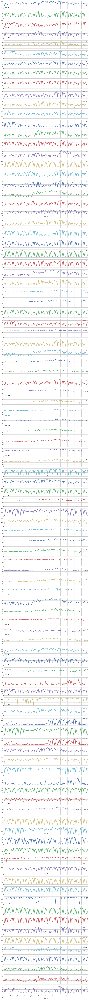

In [53]:
all_raw_df_valuesonly_daily.plot(subplots=True, figsize=(15,200))

C:\Users\arjun\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: .resample() is now a deferred operation
use .resample(...).mean() instead of .resample(...)
  if __name__ == '__main__':


array([<matplotlib.axes._subplots.AxesSubplot object at 0x000001A670181A20>,
       <matplotlib.axes._subplots.AxesSubplot object at 0x000001A60775E828>], dtype=object)

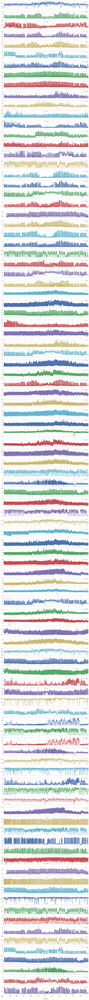

In [54]:
all_raw_df_valuesonly_hourly.plot(subplots=True, figsize=(15,200))

### Let's aggregate to annual data and plot

In [55]:
all_raw_df_valuesonly_annual = all_raw_df_valuesonly_hourly.resample('A', how='sum')

C:\Users\arjun\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: .resample() is now a deferred operation
use .resample(...).mean() instead of .resample(...)
  if __name__ == '__main__':
C:\Users\arjun\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).sum()
  if __name__ == '__main__':


In [56]:
# all_raw_df_valuesonly_annual.T.sort("2012-12-31 00:00:00+00:00").plot(kind='barh', figsize=(15,30), legend=False)
# plt.xlabel("Total kWh for 2012")
# plt.ylabel("SITE_ID")

### Total kWh by Site ID

In [163]:
 t = meta_annualdata.drop(['SQ_FT','index','LAT','LNG','TIME_ZONE','TZ_OFFSET','INDUSTRY','SUB_INDUSTRY'],axis=1)

In [186]:
t.set_index('SITE_ID')

,TotalkWh
SITE_ID,
6,2.719028e+05
8,7.878762e+05
9,2.450373e+05
10,2.789726e+06
12,3.464750e+05
13,3.509959e+05
14,1.908315e+06
21,8.005481e+05
22,5.162678e+05


In [187]:
t.dtypes


SITE_ID       int64
TotalkWh    float64
dtype: object

In [167]:
t.SITE_ID.astype(int)

0       6
1       8
2       9
3      10
4      12
5      13
6      14
7      21
8      22
9      25
10     29
11     30
12     31
13     32
14     36
15     41
16     42
17     44
18     45
19     49
20     51
21     55
22     56
23     65
24     78
25     88
26     92
27     99
28    100
29    101
     ... 
70    478
71    484
72    492
73    496
74    512
75    648
76    654
77    673
78    674
79    690
80    697
81    703
82    716
83    718
84    731
85    737
86    742
87    744
88    745
89    755
90    761
91    765
92    766
93    767
94    771
95    786
96    805
97    808
98    832
99    887
Name: SITE_ID, dtype: int32

In [188]:
t.dtypes

SITE_ID       int64
TotalkWh    float64
dtype: object

In [169]:
t['SITE_ID'].apply(int)

0       6
1       8
2       9
3      10
4      12
5      13
6      14
7      21
8      22
9      25
10     29
11     30
12     31
13     32
14     36
15     41
16     42
17     44
18     45
19     49
20     51
21     55
22     56
23     65
24     78
25     88
26     92
27     99
28    100
29    101
     ... 
70    478
71    484
72    492
73    496
74    512
75    648
76    654
77    673
78    674
79    690
80    697
81    703
82    716
83    718
84    731
85    737
86    742
87    744
88    745
89    755
90    761
91    765
92    766
93    767
94    771
95    786
96    805
97    808
98    832
99    887
Name: SITE_ID, dtype: int64

In [161]:
t.dtypes

index        object
TotalkWh    float64
dtype: object

In [170]:
t.SITE_ID = t.SITE_ID.astype(np.int64)

In [178]:
t.dtypes

SITE_ID       int64
TotalkWh    float64
dtype: object

C:\Users\arjun\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


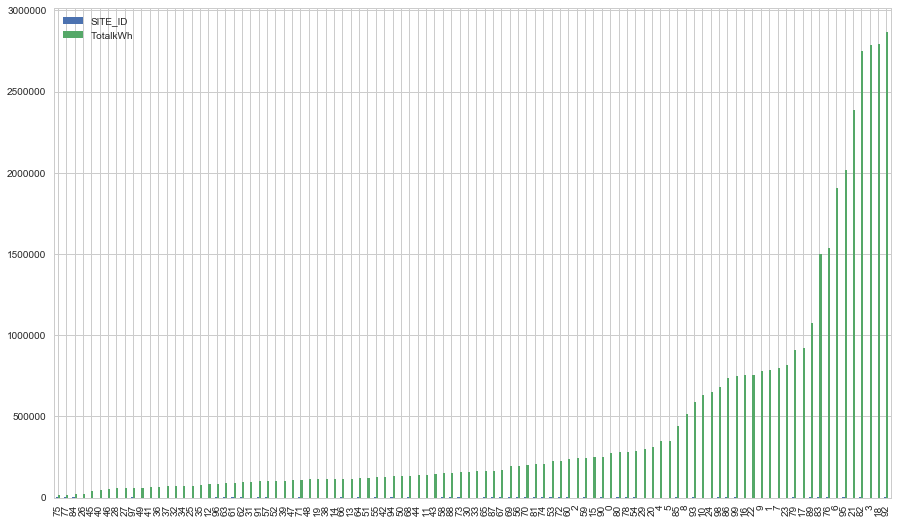

In [189]:
t.sort('TotalkWh').plot(kind='bar',figsize=(15,9))

C:\Users\arjun\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


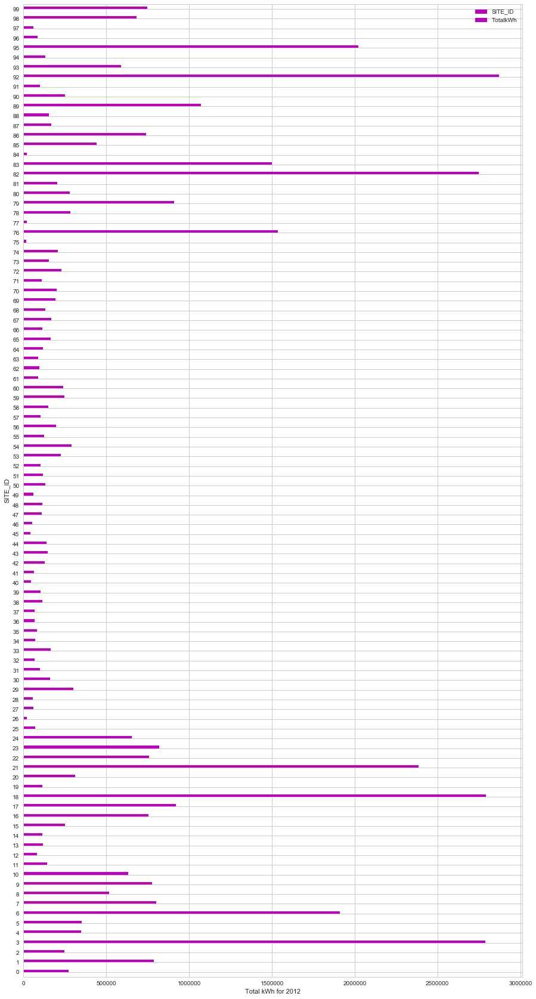

In [190]:
t.sort('SITE_ID' ,ascending=True ).plot(kind='barh', color='m', figsize=(15,30))
plt.xlabel("Total kWh for 2012")
plt.ylabel("SITE_ID")

In [143]:
all_raw_df_valuesonly_annual


,10,100,101,103,109,111,116,12,13,136,...,786,8,805,808,832,88,887,9,92,99
dttm_utc,,,,,,,,,,,,,,,,,,,,,
2012-12-31 00:00:00+00:00,2.789726e+06,55742.22793,301808.456153,159626.760011,98459.519152,68382.404857,163701.642387,346474.981141,350995.885502,69406.905445,...,2.019870e+06,787876.171582,85648.398485,58306.514965,682097.247783,69844.587286,745863.598372,245037.298013,21414.894877,58097.823438


C:\Users\arjun\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


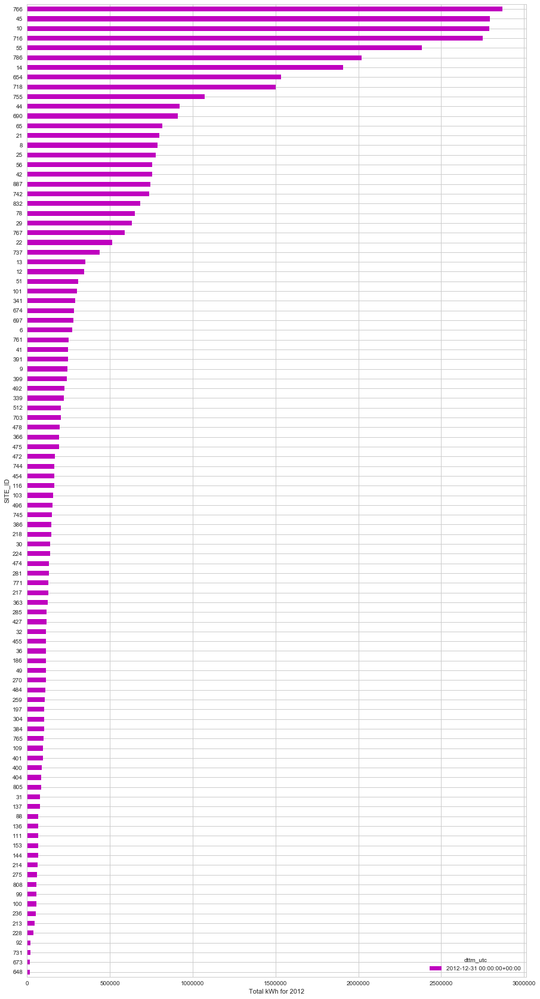

In [191]:
all_raw_df_valuesonly_annual.T.sort("2012-12-31 00:00:00+00:00").plot(kind='barh', color='m', figsize=(15,30))
plt.xlabel("Total kWh for 2012")
plt.ylabel("SITE_ID")

In [193]:
all_raw_df_valuesonly_annual.T

dttm_utc,2012-12-31 00:00:00+00:00
10,2.789726e+06
100,5.574223e+04
101,3.018085e+05
103,1.596268e+05
109,9.845952e+04
111,6.838240e+04
116,1.637016e+05
12,3.464750e+05
13,3.509959e+05
136,6.940691e+04


In [147]:
g = meta_annualdata.xs(['TotalkWh','SITE_ID'],axis=1)

In [148]:
g

,TotalkWh,SITE_ID
0,2.719028e+05,6
1,7.878762e+05,8
2,2.450373e+05,9
3,2.789726e+06,10
4,3.464750e+05,12
5,3.509959e+05,13
6,1.908315e+06,14
7,8.005481e+05,21
8,5.162678e+05,22
9,7.771035e+05,25


In [151]:
kk =g.nlargest(10, 'TotalkWh')

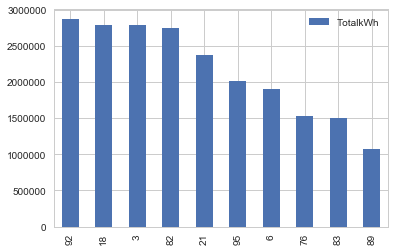

In [154]:
kk.plot(kind='bar')

In [ ]:
kk.plot.scatter(x = 'TotalkWh',y ='', s=50);

In [229]:
meta_annualdata['SITE_ID'] != meta_annuldata['index']

NameError: name 'meta_annuldata' is not defined

In [233]:
pd.DataFrame(meta_annualdata, columns=['SITE_ID', 'index'])

,SITE_ID,index
0,6,6
1,8,8
2,9,9
3,10,10
4,12,12
5,13,13
6,14,14
7,21,21
8,22,22
9,25,25


In [235]:
annualdata

,TotalkWh
10,2.789726e+06
100,5.574223e+04
101,3.018085e+05
103,1.596268e+05
109,9.845952e+04
111,6.838240e+04
116,1.637016e+05
12,3.464750e+05
13,3.509959e+05
136,6.940691e+04


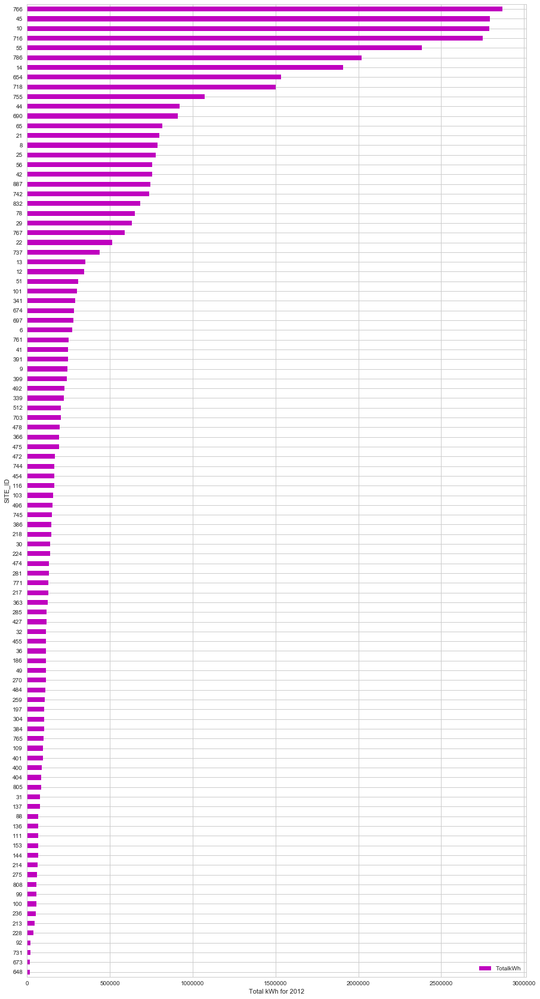

In [230]:
annualdata.sort_values(by='TotalkWh' ,axis='index',ascending=True ).plot(kind='barh', color='m', figsize=(15,30))
plt.xlabel("Total kWh for 2012")
plt.ylabel("SITE_ID")

### merging meta data with all the energy datasets. 

In [238]:
annualdata = all_raw_df_valuesonly_annual.T 
annualdata.columns = ["TotalkWh"]

In [239]:
annualdata

,TotalkWh
10,2.789726e+06
100,5.574223e+04
101,3.018085e+05
103,1.596268e+05
109,9.845952e+04
111,6.838240e+04
116,1.637016e+05
12,3.464750e+05
13,3.509959e+05
136,6.940691e+04


In [198]:
all_raw_df_valuesonly_annual.T

dttm_utc,2012-12-31 00:00:00+00:00
10,2.789726e+06
100,5.574223e+04
101,3.018085e+05
103,1.596268e+05
109,9.845952e+04
111,6.838240e+04
116,1.637016e+05
12,3.464750e+05
13,3.509959e+05
136,6.940691e+04


In [59]:
annualdata = annualdata.reset_index()

In [240]:
annualdata.info()

<class 'pandas.core.frame.DataFrame'>
Index: 100 entries, 10 to 99
Data columns (total 1 columns):
TotalkWh    100 non-null float64
dtypes: float64(1)
memory usage: 1.6+ KB


### The problem is that we need to merge the annualdata.index with the meta_df.SITE_ID 
but one is a float and the other is a string. We must convert them to the same type to merge.

In [61]:
meta_df['SITE_ID'] = meta_df['SITE_ID'].apply(str)

In [62]:
meta_annualdata = pd.merge(meta_df, annualdata, left_on="SITE_ID", right_on="index")

In [63]:
meta_annualdata.drop(['LAT','LNG'],axis=1)

,SITE_ID,INDUSTRY,SUB_INDUSTRY,SQ_FT,TIME_ZONE,TZ_OFFSET,index,TotalkWh
0,6,Commercial Property,Shopping Center/Shopping Mall,161532,America/Denver,-06:00,6,2.719028e+05
1,8,Commercial Property,Shopping Center/Shopping Mall,823966,America/New_York,-04:00,8,7.878762e+05
2,9,Commercial Property,Corporate Office,169420,America/New_York,-04:00,9,2.450373e+05
3,10,Commercial Property,Shopping Center/Shopping Mall,1029798,America/New_York,-04:00,10,2.789726e+06
4,12,Commercial Property,Business Services,179665,America/New_York,-04:00,12,3.464750e+05
5,13,Commercial Property,Commercial Real Estate,185847,America/New_York,-04:00,13,3.509959e+05
6,14,Commercial Property,Business Services,1675720,America/Los_Angeles,-07:00,14,1.908315e+06
7,21,Commercial Property,Shopping Center/Shopping Mall,783982,America/New_York,-04:00,21,8.005481e+05
8,22,Commercial Property,Bank/Financial Services,318130,America/Los_Angeles,-07:00,22,5.162678e+05
9,25,Commercial Property,Shopping Center/Shopping Mall,1807149,America/New_York,-04:00,25,7.771035e+05


In [ ]:
meta_annualdata.plot(kind='scatter', x="SQ_FT", y="TotalkWh", s=40, marker='*',color= 'b',figsize=(15,8))

In [ ]:
# Top_10_Kwh = meta_annualdata.groupby(['TotalkWh','INDUSTRY','SUB_INDUSTRY','SQ_FT']).size().sort_values(ascending=False).head(10)

In [ ]:
# Top_10_Kwh

In [ ]:
meta_annualdata.groupby(['INDUSTRY','SUB_INDUSTRY']).size().sort_values(ascending=False).head(10)

In [ ]:
# Top_10 = meta_annualdata.groupby(['TotalkWh','INDUSTRY','SUB_INDUSTRY','SQ_FT']).size().sort_values(ascending=False).head(10)

In [ ]:
# Top_10_SQFT = meta_annualdata.groupby(['SQ_FT','TotalkWh','INDUSTRY','SUB_INDUSTRY','SITE_ID']).size().sort_values(ascending=False).head(10)

### Top 10 Buildings by Total KWh

In [ ]:
Top_10_kWh = meta_annualdata.nlargest(10, 'TotalkWh').drop(['SITE_ID','LAT','LNG','TZ_OFFSET','INDUSTRY','SUB_INDUSTRY'],axis=1)

In [ ]:
Top_10_kWh

In [ ]:
Top_10_= meta_annualdata.xs('TotalkWh', level=None, axis=1)

In [ ]:
Top_10_.nlargest(10).plot(kind = 'bar', y = 'Site_ID')

In [ ]:
Top_10_kWh.plot(kind='bar',figsize=(15,8))

### Top 10 Buildings by Square footage

In [ ]:
Top_10_SQFT = meta_annualdata.nlargest(10, 'SQ_FT').drop(['SITE_ID','LAT','LNG','TZ_OFFSET','INDUSTRY','SUB_INDUSTRY'],axis=1)

In [ ]:
Top_10_SQFT

In [ ]:
Top_10_SQFT.plot(kind='bar',figsize=(15,8))

### mean Hourly distributed 

array([<matplotlib.axes._subplots.AxesSubplot object at 0x000001A620D04C88>,
       <matplotlib.axes._subplots.AxesSubplot object at 0x000001A68356E588>], dtype=object)

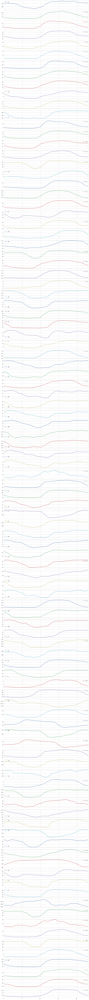

In [204]:
all_raw_df_valuesonly.groupby(all_raw_df_valuesonly.index.hour).mean().plot(subplots=True, figsize=(15,200))

array([<matplotlib.axes._subplots.AxesSubplot object at 0x000001A687316A58>,
       <matplotlib.axes._subplots.AxesSubplot object at 0x000001A68E169F28>], dtype=object)

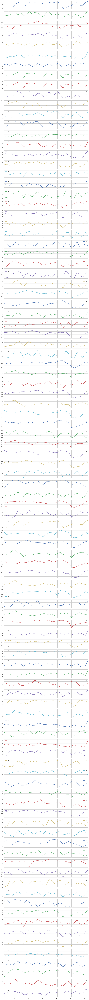

In [211]:
all_raw_df_valuesonly.groupby(all_raw_df_valuesonly.index.day).mean().plot(subplots=True, figsize=(15,200))

In [206]:
all_raw_df_valuesonly.max()

10     527.3773
100     39.3927
101    108.0029
103     78.3172
109     36.1648
111     24.3904
116     52.2496
12      78.0153
13      79.0333
136     42.4730
137     35.4658
14     651.5774
144     51.7628
153     25.2517
186     41.8157
197     50.5091
21     248.3687
213     28.0901
214     43.4003
217     41.0026
218     56.6924
22     124.9859
224     48.4046
228     17.7076
236     27.4365
25     241.0950
259     43.7350
270     35.9375
275     27.7789
281     26.8503
         ...   
654    295.1025
673      6.8247
674    174.3688
690    244.3275
697    172.0665
703     69.7217
716    519.6556
718    427.4872
731     20.3537
737    113.6684
742    136.2264
744     31.5130
745     54.1945
755    287.6402
761    113.2479
765     31.1393
766    515.7718
767    142.5885
771     46.3945
78     186.9605
786    276.3484
8      244.4372
805     22.2000
808     41.2048
832    211.6195
88      24.9119
887    213.6951
9       83.4004
92       7.9148
99      27.9033
dtype: float64

In [207]:
agg = all_raw_df_valuesonly.sum(axis = 1)

In [208]:
agg['2012-12-31 23:25:00+00:00']

3908.6474000000007

In [209]:
agg

dttm_utc
2012-01-01 00:05:00+00:00    1726.8096
2012-01-01 00:10:00+00:00    2642.5760
2012-01-01 00:15:00+00:00    2626.6457
2012-01-01 00:20:00+00:00    2637.1007
2012-01-01 00:25:00+00:00    2598.3540
2012-01-01 00:30:00+00:00    2560.4280
2012-01-01 00:35:00+00:00    2543.9534
2012-01-01 00:40:00+00:00    2526.7476
2012-01-01 00:45:00+00:00    2513.8649
2012-01-01 00:50:00+00:00    2519.6888
2012-01-01 00:55:00+00:00    2526.5838
2012-01-01 01:00:00+00:00    2540.7799
2012-01-01 01:05:00+00:00    2547.4173
2012-01-01 01:10:00+00:00    2548.3533
2012-01-01 01:15:00+00:00    2512.5404
2012-01-01 01:20:00+00:00    2520.6372
2012-01-01 01:25:00+00:00    2489.0430
2012-01-01 01:30:00+00:00    2511.9719
2012-01-01 01:35:00+00:00    2482.3802
2012-01-01 01:40:00+00:00    2491.4451
2012-01-01 01:45:00+00:00    2457.7256
2012-01-01 01:50:00+00:00    2429.8406
2012-01-01 01:55:00+00:00    2452.8043
2012-01-01 02:00:00+00:00    2449.3147
2012-01-01 02:05:00+00:00    2473.4051
2012-01-01 02:10

In [212]:
AA = pd.DataFrame(agg)

In [ ]:


# AA['index_col'] = AA.index

In [213]:
AA

,0
dttm_utc,
2012-01-01 00:05:00+00:00,1726.8096
2012-01-01 00:10:00+00:00,2642.5760
2012-01-01 00:15:00+00:00,2626.6457
2012-01-01 00:20:00+00:00,2637.1007
2012-01-01 00:25:00+00:00,2598.3540
2012-01-01 00:30:00+00:00,2560.4280
2012-01-01 00:35:00+00:00,2543.9534
2012-01-01 00:40:00+00:00,2526.7476
2012-01-01 00:45:00+00:00,2513.8649


In [214]:
AA.reset_index(level=0, inplace=True)

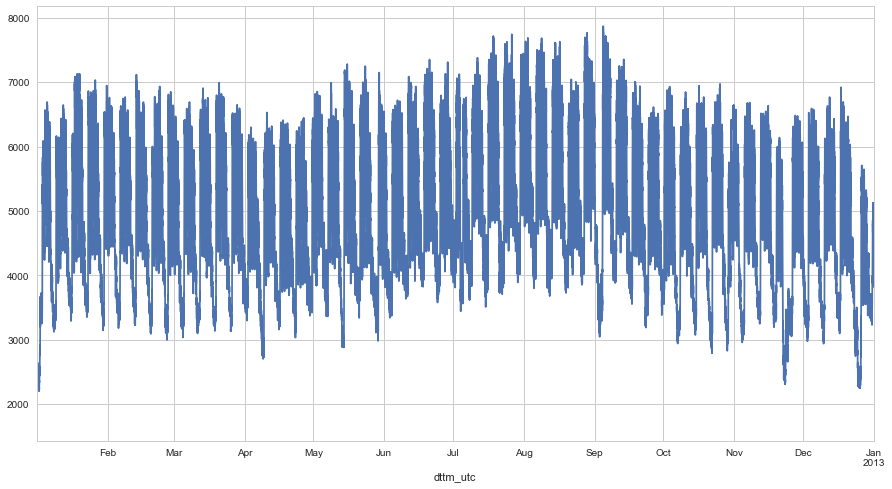

In [215]:
agg.plot(figsize=(15,8))
savefig('C:/Users/arjun/Desktop/figure.jpeg')


array([<matplotlib.axes._subplots.AxesSubplot object at 0x000001A695945A20>], dtype=object)

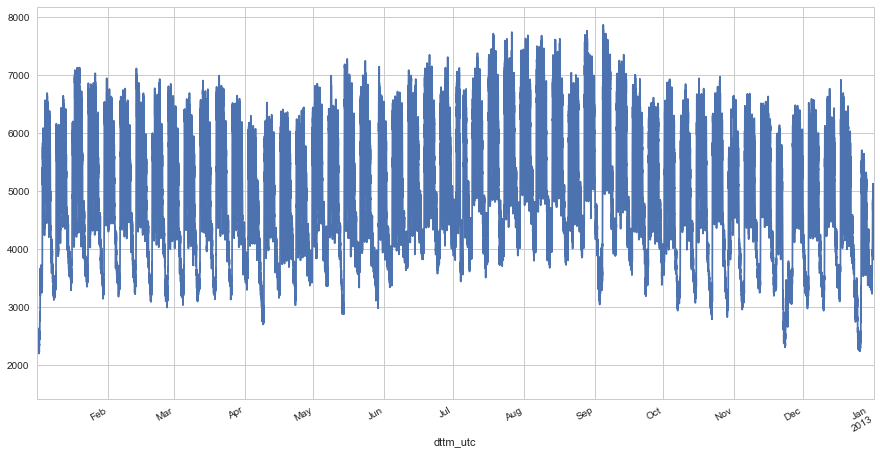

In [216]:
agg.plot(subplots=True, figsize=(15,8))

In [217]:
all_raw_df_valuesonly_hourly.sum(axis = 1)

TypeError: f() got an unexpected keyword argument 'axis'

In [218]:
f.head(10)

NameError: name 'f' is not defined

In [219]:
all_raw_df_valuesonly_hourly_1 = all_raw_df_valuesonly.truncate(after='2012-12-31').resample('H')

In [ ]:
all_raw_df_valuesonly_hourly_1

In [ ]:
all_raw_df_valuesonly_annual.sum(axis = 1)

In [ ]:
all_raw_df_valuesonly_hourly_1.head()

In [ ]:
all_raw_df_valuesonly_hourly_1.plot(kind='box',figsize=(15,8))

In [ ]:
all_raw_df_valuesonly_hourly_1.plot(kind='scatter', x="10", y="100", s=40, marker='*',color= 'green',figsize=(15,8))

In [ ]:
all_raw_df_valuesonly_hourly_1.plot(y='10',use_index=True,figsize=(10,6))

### Hourly distribution for all the buildings from 5pm to 8pm

In [ ]:
# all_raw_df_valuesonly_hourly_1.between_time('17:00','20:00').plot(kind='bar',figsize=(25,12),subplots=True)

In [220]:
all_raw_df_valuesonly_hourly_1['10'].count()

dttm_utc
2012-01-01 00:00:00+00:00    10
2012-01-01 01:00:00+00:00    12
2012-01-01 02:00:00+00:00    12
2012-01-01 03:00:00+00:00    12
2012-01-01 04:00:00+00:00    12
2012-01-01 05:00:00+00:00    12
2012-01-01 06:00:00+00:00    12
2012-01-01 07:00:00+00:00    12
2012-01-01 08:00:00+00:00    12
2012-01-01 09:00:00+00:00    12
2012-01-01 10:00:00+00:00    12
2012-01-01 11:00:00+00:00    12
2012-01-01 12:00:00+00:00    12
2012-01-01 13:00:00+00:00    12
2012-01-01 14:00:00+00:00    12
2012-01-01 15:00:00+00:00    12
2012-01-01 16:00:00+00:00    12
2012-01-01 17:00:00+00:00    12
2012-01-01 18:00:00+00:00    12
2012-01-01 19:00:00+00:00    12
2012-01-01 20:00:00+00:00    12
2012-01-01 21:00:00+00:00    12
2012-01-01 22:00:00+00:00    12
2012-01-01 23:00:00+00:00    12
2012-01-02 00:00:00+00:00    12
2012-01-02 01:00:00+00:00    12
2012-01-02 02:00:00+00:00    12
2012-01-02 03:00:00+00:00    12
2012-01-02 04:00:00+00:00    12
2012-01-02 05:00:00+00:00    12
                             ..

In [221]:
##Sum of each building for whole year
BB=all_raw_df_valuesonly.sum(axis = 0)

In [222]:
bb= pd.DataFrame(BB)

In [223]:
bb.reset_index(level=0, inplace=True)

In [224]:
bb.head()

,index,0
0,10,3.354402e+07
1,100,6.701098e+05
2,101,3.630819e+06
3,103,1.918911e+06
4,109,1.183645e+06


array([<matplotlib.axes._subplots.AxesSubplot object at 0x000001A69593EA20>], dtype=object)

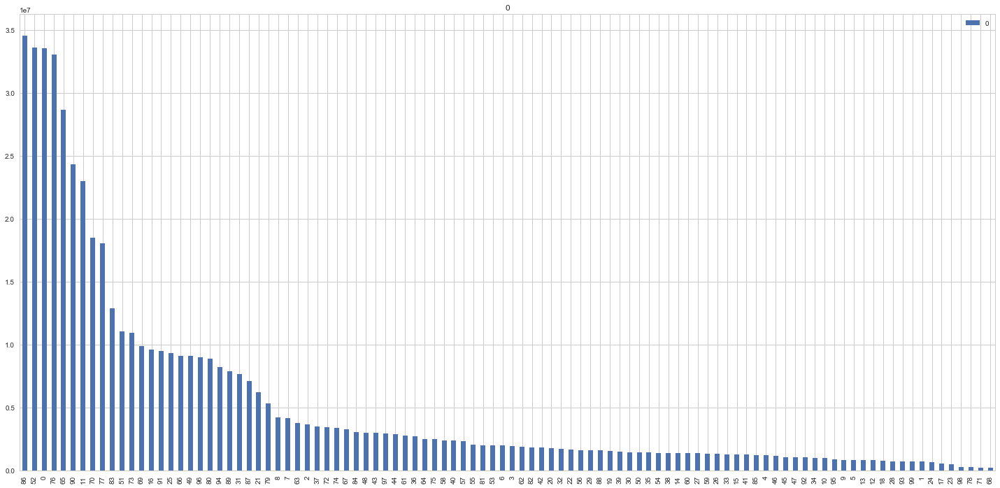

In [225]:
bb.sort_values(by=0 ,axis='index',ascending=False ).plot(kind='bar',figsize=(25,12),subplots=True)

In [ ]:
bb.plot(kind='bar',figsize=(15,10),subplots=True)

# .plot(subplots=True, figsize=(15,200))

In [226]:
all_raw_df_valuesonly_hourly_1.between_time('17:00','20:00')

C:\Users\arjun\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: .resample() is now a deferred operation
use .resample(...).mean() instead of .resample(...)
  if __name__ == '__main__':


,10,100,101,103,109,111,116,12,13,136,...,786,8,805,808,832,88,887,9,92,99
dttm_utc,,,,,,,,,,,,,,,,,,,,,
2012-01-01 17:00:00+00:00,87.506350,5.121042,29.711033,10.531275,5.172633,6.529317,12.578583,27.838800,28.202042,1.888733,...,171.438367,20.951800,2.207033,5.356650,18.138800,6.668858,61.539992,19.096375,1.846800,2.347183
2012-01-01 18:00:00+00:00,87.664783,5.142933,20.301683,9.937975,5.194550,6.529317,11.707758,27.672100,28.033167,1.895017,...,168.239875,20.951792,1.579550,5.379542,18.138800,6.668858,62.972250,19.096367,1.846800,2.325258
2012-01-01 19:00:00+00:00,87.830792,5.121050,12.707717,10.036858,6.816517,6.529317,11.901275,27.588750,27.948742,1.898192,...,203.423100,20.369800,1.503817,5.356650,17.634942,6.668858,63.163225,19.031417,1.846800,2.237517
2012-01-01 20:00:00+00:00,87.615033,5.142933,11.454833,10.086300,7.397358,6.529317,11.514242,27.088650,27.442117,1.913883,...,237.966650,20.951800,2.390942,5.379542,18.138800,6.668867,61.396775,18.966458,1.802833,2.281400
2012-01-02 17:00:00+00:00,236.075425,5.843267,13.449225,15.524983,6.564442,7.451108,15.481333,35.590350,36.054750,1.907592,...,241.165100,23.279767,1.730992,6.112075,20.154233,7.610358,67.507792,36.536375,2.374450,3.400150
2012-01-02 18:00:00+00:00,230.764217,5.821383,13.577083,13.151742,6.838408,7.451108,14.900783,35.757050,36.223608,1.942167,...,259.076600,23.279767,2.996767,6.089183,20.154233,7.610358,69.847167,36.763725,2.330475,3.224658
2012-01-02 19:00:00+00:00,225.750417,5.930800,13.116825,11.569575,6.783608,7.527917,14.126717,35.840400,36.308058,1.890308,...,255.878100,23.279767,1.590358,6.203642,20.154233,7.688817,69.990383,36.601333,2.330475,3.619542
2012-01-02 20:00:00+00:00,224.095725,6.434150,14.420842,11.965117,6.553483,7.527917,15.674850,35.757050,36.223617,1.901325,...,252.679617,23.861758,2.304367,6.730150,20.658092,7.688817,69.226517,36.146683,2.154575,3.729217
2012-01-03 17:00:00+00:00,366.719300,16.041583,23.165392,42.767900,7.221983,16.361650,18.480842,56.594450,57.332942,12.224167,...,257.797208,79.733058,17.612883,16.779492,69.028292,16.711508,167.002967,44.038525,3.649617,21.958483


In [ ]:
print('all_raw_df_valuesonly_hourly_1[10]')

In [227]:
all_raw_df_valuesonly_hourly.head()

C:\Users\arjun\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: .resample() is now a deferred operation
use .resample(...).mean() instead of .resample(...)
  if __name__ == '__main__':


,10,100,101,103,109,111,116,12,13,136,...,786,8,805,808,832,88,887,9,92,99
dttm_utc,,,,,,,,,,,,,,,,,,,,,
2012-01-01 00:00:00+00:00,102.216050,5.252364,25.661836,12.405627,5.953764,8.019490,11.505445,25.823245,26.040460,1.902570,...,251.225764,20.951790,2.856145,5.548940,18.1388,8.216627,57.119030,18.742055,1.822818,2.919555
2012-01-01 01:00:00+00:00,100.771400,5.318008,25.952392,12.360683,5.983650,7.988767,11.417483,25.671700,26.006675,2.672825,...,247.562067,20.951792,2.466675,5.562675,18.1388,8.159567,56.574775,18.576725,1.802833,2.785933
2012-01-01 02:00:00+00:00,95.755967,5.361792,26.412633,12.459567,5.852142,7.988767,11.223967,25.171600,25.500058,2.740400,...,242.444517,20.951800,2.120458,5.608458,18.1388,8.159567,56.670258,18.836525,1.846800,2.983375
2012-01-01 03:00:00+00:00,95.627817,5.383683,26.540467,12.360675,6.038442,7.911958,11.417483,25.421650,25.753375,2.751400,...,241.165117,20.951800,3.429533,5.631350,18.1388,8.081108,56.479292,18.804067,1.802833,2.873692
2012-01-01 04:00:00+00:00,95.431533,5.668183,26.259208,12.558458,6.158983,8.065575,11.320725,25.505000,25.837800,2.729400,...,241.804808,20.951800,2.098825,5.928942,18.1388,8.238025,55.572183,18.933967,1.802833,2.917558
